<a href="https://colab.research.google.com/github/Xplod4432/electrical-grid-stability/blob/main/electrical_grid_simulation_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing modules

**Modules used**



*   Pandas for data preprocessing and cleaning
*   Scikit-learn for machine learning algorithms
*   Matplotlib and Seaborn for data visualization


In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
#import numpy as np

# Importing dataset

In [2]:
data = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00471/Data_for_UCI_named.csv")
data.info()
data.shape
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    10000 non-null  float64
 1   tau2    10000 non-null  float64
 2   tau3    10000 non-null  float64
 3   tau4    10000 non-null  float64
 4   p1      10000 non-null  float64
 5   p2      10000 non-null  float64
 6   p3      10000 non-null  float64
 7   p4      10000 non-null  float64
 8   g1      10000 non-null  float64
 9   g2      10000 non-null  float64
 10  g3      10000 non-null  float64
 11  g4      10000 non-null  float64
 12  stab    10000 non-null  float64
 13  stabf   10000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [22]:
data.describe()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5.250000,5.250001,5.250004,5.249997,3.750000,-1.250000,-1.250000,-1.250000,0.525000,0.525000,0.525000,0.525000,0.015731
std,2.742548,2.742549,2.742549,2.742556,0.752160,0.433035,0.433035,0.433035,0.274256,0.274255,0.274255,0.274255,0.036919
min,0.500793,0.500141,0.500788,0.500473,1.582590,-1.999891,-1.999945,-1.999926,0.050009,0.050053,0.050054,0.050028,-0.080760
25%,2.874892,2.875140,2.875522,2.874950,3.218300,-1.624901,-1.625025,-1.624960,0.287521,0.287552,0.287514,0.287494,-0.015557
50%,5.250004,5.249981,5.249979,5.249734,3.751025,-1.249966,-1.249974,-1.250007,0.525009,0.525003,0.525015,0.525002,0.017142
75%,7.624690,7.624893,7.624948,7.624838,4.282420,-0.874977,-0.875043,-0.875065,0.762435,0.762490,0.762440,0.762433,0.044878
max,9.999469,9.999837,9.999450,9.999443,5.864418,-0.500108,-0.500072,-0.500025,0.999937,0.999944,0.999982,0.999930,0.109403


# Data Preprocessing

Finding NaN values across the whole data set using isna and sum method.

In [3]:
data.isna().sum().sum()

0

# Analyzing and Visualizing Data

Checking the distribution of the target variable, which is the stability index in this case.

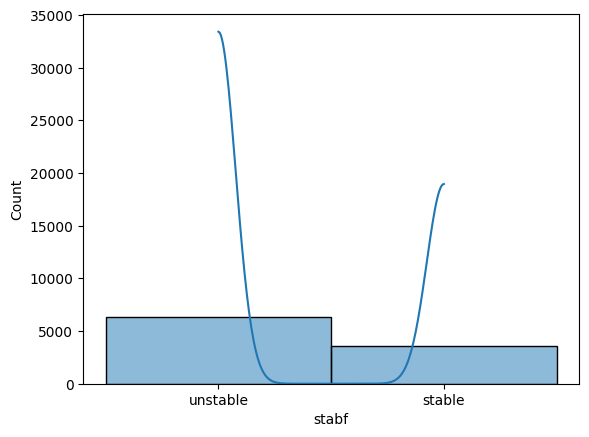

In [4]:
sns.histplot(data=data, x="stabf", kde=True)
plt.show()

Plotting the heatmap to check the correlation between different columns

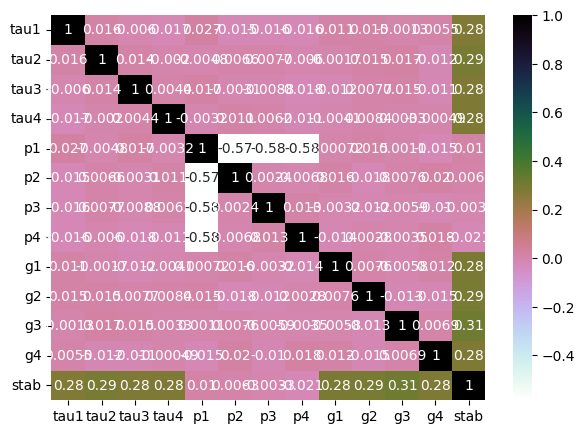

In [5]:
plt.figure(figsize=(7,5))
sns.heatmap(data.corr(), annot=True, cmap='cubehelix_r')
plt.show()

Visualizing classification using Seaborn of pair-wise parameters

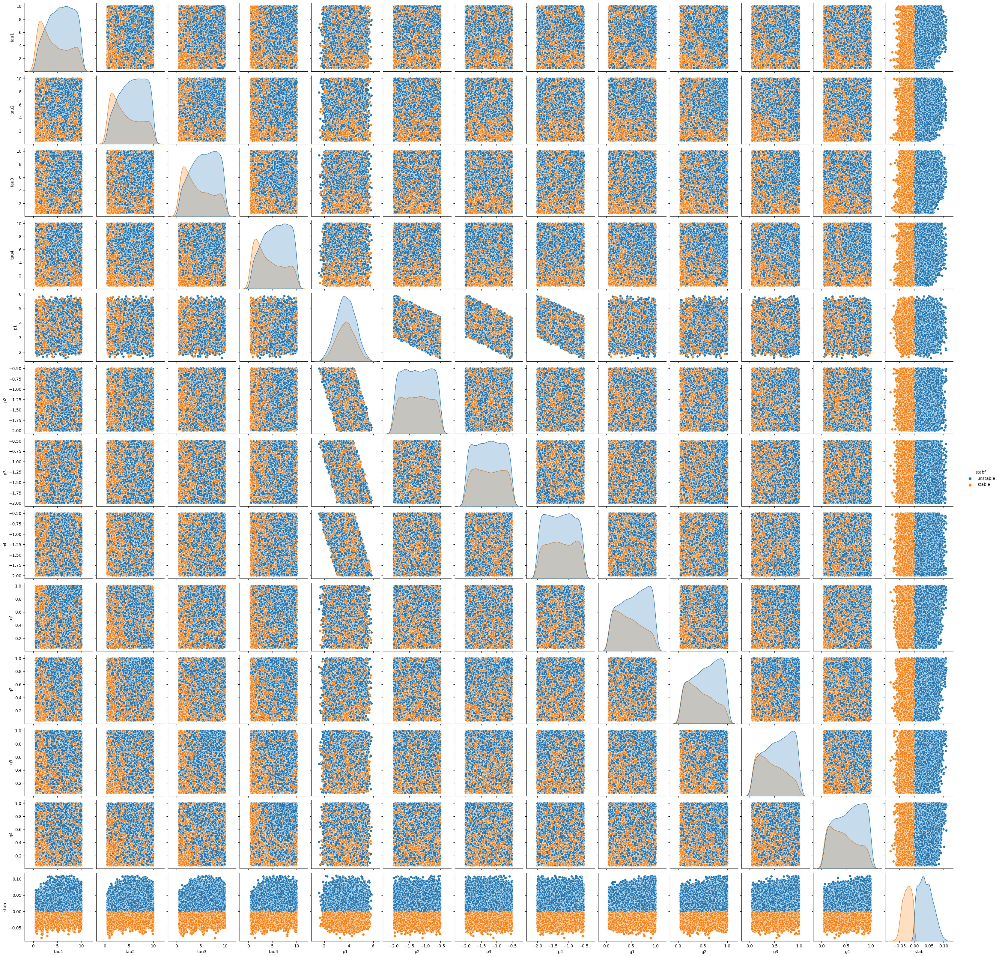

In [6]:
# Visualize the whole dataset
sns.pairplot(data, hue='stabf')

# Training Model

Splitting the data into features (input variables) and target (output variable). In this dataset, the target variable is 'stabf', which indicates whether the grid behavior is stable or unstable. After that the label is encoded as 'stable' as 0 and 'unstable' as 1.

In [7]:
# Split the data into features and target variable
X = data.drop(columns=['stabf', 'stab'])
y = pd.get_dummies(data['stabf'], drop_first=True)['unstable']

Splitting the data into training and test sets using the train_test_split function from the Scikit-learn library.

In [8]:
from sklearn.model_selection import train_test_split

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Importing the necessary modules to compare all the algorithms for this classification problem.

In [9]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

Creating models using all six algorithms so it can be compared in the next section of the code.

In [10]:
models = []
models.append(('LR', LogisticRegression(max_iter=100)))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVC', SVC(gamma='auto')))
models.append(('RFC', RandomForestClassifier(n_estimators=100, random_state=1)))

# Model Evaluation

Comparing the trained models which were trained using different algorithms

In [11]:
# Evaluate each model in turn
import warnings
warnings.filterwarnings('ignore')
results = []
model_names = []
for name, model in models:
  kfold = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)
  cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
  results.append(cv_results)
  model_names.append(name)
  print('%s: %f (%f)' % (name, cv_results.mean(), cv_results.std()))

LR: 0.816250 (0.014274)
LDA: 0.816000 (0.015266)
KNN: 0.784500 (0.020327)
NB: 0.832375 (0.015973)
SVC: 0.901250 (0.014705)
RFC: 0.921500 (0.006633)


# Train using Random Forest Classifier

Using Random Forest Classifier to train and predict the classification problem

In [12]:
# instantiate a Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=100, random_state=1)

# fit the model to the training data
rf_clf.fit(X_train, y_train)

# make predictions on the testing data
y_pred = rf_clf.predict(X_test)

Checking the accuracy of model and a detailed report for each class of the grid set.

In [13]:
# evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

In [14]:
# print the results
print("Random Forest Classifier Results:")
print("Accuracy:", accuracy)
print("Classification Report:\n", report)

Random Forest Classifier Results:
Accuracy: 0.9065
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.86      0.86       693
           1       0.93      0.93      0.93      1307

    accuracy                           0.91      2000
   macro avg       0.90      0.90      0.90      2000
weighted avg       0.91      0.91      0.91      2000



# Train using Logistic Regression

Since Linear Regression is faster in terms of training and is less complex, it can also be used to solve the classification problems.

In [16]:
# Train a Logistic Regression model
lr_model = LogisticRegression(random_state=42).fit(X_train, y_train)

# Make predictions on the test set
y_pred = lr_model.predict(X_test)

Checking the accuracy of model and a detailed report for each class of the grid set.

In [17]:
# evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

In [24]:
# print the results
print("Logistic Regression Results:")
print("Accuracy:", accuracy)
print("Classification Report:\n", report)

Logistic Regression Results:
Accuracy: 0.886
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.81      0.83       693
           1       0.90      0.92      0.91      1307

    accuracy                           0.89      2000
   macro avg       0.88      0.87      0.87      2000
weighted avg       0.89      0.89      0.89      2000



# Training using SVM

Support Vector Machine performs well where a hyperplane can be drwan to separate classes and the seprabality is to be maximised by this hyperplane.

In [19]:
# Create SVM model
svm_model = SVC()

# Fit SVM model to training data
svm_model.fit(X_train, y_train)

# Make predictions on test data
y_pred = svm_model.predict(X_test)

Checking the accuracy of model and a detailed report for each class of the grid set.

In [20]:
# evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

In [21]:
# print the results
print("SVM Results:")
print("Accuracy:", accuracy)
print("Classification Report:\n", report)

SVM Results:
Accuracy: 0.886
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.81      0.83       693
           1       0.90      0.92      0.91      1307

    accuracy                           0.89      2000
   macro avg       0.88      0.87      0.87      2000
weighted avg       0.89      0.89      0.89      2000



# Testing the Model

Here we take some random values based on the average plot to see if the Random Decision Forest model can predict accurately.

In [15]:
import numpy as np

X_new = np.array([[2.959060, 3.079885, 8.381025, 9.780754, 3.763085, -0.782604, -1.257395, -1.723086, 0.650456, 0.859578, 0.887445, 0.958034], 
                  [9.304097, 4.902524, 3.047541, 1.369357, 5.067812, -1.940058, -1.872742, -1.255012, 0.413441, 0.862414, 0.562139, 0.781760], 
                  [3.134112, 7.608772, 4.943759, 9.857573, 3.525811, -1.125531, -1.845975, -0.554305, 0.797110, 0.455450, 0.656947, 0.820923]])
#Prediction of the stability from the input vector
prediction = rf_clf.predict(X_new)
print("Prediction of Stability: {}".format(prediction))

Prediction of Stability: [1 0 1]
